<a href="https://colab.research.google.com/github/CakeNuthep/Normal-Distribution/blob/main/Random%20Normal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Nomal Random

In [1]:
import matplotlib.pyplot as plt
import numpy as np

In [2]:
mu, sigma = 0, 1 # mean and standard deviation
s = np.random.normal(mu, sigma, 1000)

In [3]:
s

array([ 1.23848855e+00, -4.24388545e-01,  9.35696976e-01, -9.06310801e-01,
       -7.26753565e-01, -1.57946443e+00,  7.33954588e-01, -1.43279892e-01,
       -2.21698259e+00, -1.83522695e+00, -7.02113887e-01,  2.42714097e-01,
        1.26835592e+00,  5.47568650e-01, -1.29399333e+00, -1.21701543e-01,
       -1.97663047e+00,  6.56182835e-01, -9.33752040e-02, -7.82261193e-01,
        1.36797343e+00,  4.84862518e-01, -1.56420437e-01, -5.40494524e-01,
        9.98504408e-01,  2.12355645e+00, -2.06060177e-01, -1.30821906e+00,
       -1.56743515e+00,  7.42791558e-03, -1.62642691e-02, -9.07480115e-01,
       -2.48953035e-01,  1.45860669e-01,  2.07426016e+00,  3.80513329e-01,
       -5.76462117e-02, -2.18963850e-01,  1.33293551e+00, -4.73938137e-01,
        1.00413836e+00,  1.55056481e+00,  3.71603460e-01,  6.44478042e-01,
        1.87017043e-01, -4.10035847e-01,  1.87057575e-01, -1.51227534e-01,
       -9.60201062e-01,  1.42785978e-01,  6.04267454e-01,  2.47855561e-01,
        4.75574481e-01, -

In [4]:
np.mean(s)

0.023157814788141416

In [5]:
np.std(s, ddof=1)

1.0053782951363561

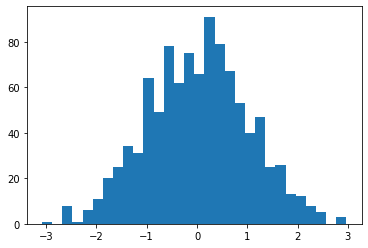

In [6]:
counts, bins, ignored = plt.hist(s, 30)

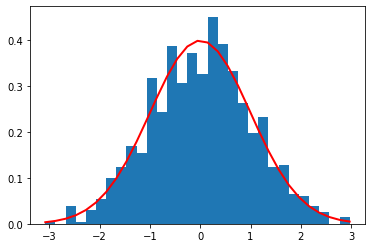

In [7]:
counts, bins, ignored = plt.hist(s, 30,density=True)
plt.plot(bins, 1/(sigma * np.sqrt(2 * np.pi)) *
               np.exp( - (bins - mu)**2 / (2 * sigma**2) ),
         linewidth=2, color='r')
plt.show()

In [8]:
density = counts / (sum(counts) * np.diff(bins))
sum(density*np.diff(bins))

0.9999999999999998

#Uniform Random

In [9]:
import matplotlib.pyplot as plt
import numpy as np

In [10]:
a = -3
b = 3
s = np.random.uniform(a,b,1000)

In [11]:
s

array([-2.82832962e+00, -2.07814632e+00, -2.49841958e+00, -1.24695549e+00,
       -1.78622115e+00, -3.37972495e-01,  1.90466342e+00,  2.98718573e+00,
       -7.98616179e-01,  5.11398540e-01, -7.19196473e-01,  6.00359980e-01,
        1.10391780e+00,  1.64913106e+00, -5.20584575e-02,  2.75899845e+00,
        1.35010833e+00,  2.04022410e+00, -2.46451571e+00,  9.39830114e-01,
       -1.61476590e+00,  3.12074407e-01,  1.20155939e+00,  3.23980431e-01,
       -1.42136892e+00,  6.49660125e-01, -2.33507984e+00, -7.01341384e-01,
       -5.63449848e-01,  1.37247861e+00, -3.37323673e-02,  1.22218401e-01,
        1.44209119e+00, -2.60734952e+00, -2.29642211e+00,  2.68067693e+00,
       -1.53237351e+00,  1.85781147e+00, -1.09795882e+00,  3.71171064e-02,
       -1.50056354e+00,  6.31032119e-01,  2.79185802e-01, -3.44277586e-01,
        2.55038884e+00,  1.09127839e+00,  2.41826389e+00, -1.10283084e+00,
       -2.12056707e+00,  4.53265441e-02, -3.15718330e-01,  1.80712691e+00,
       -1.97154437e+00,  

In [12]:
np.all(s >= -3)

True

In [13]:
np.all(s < 3)

True

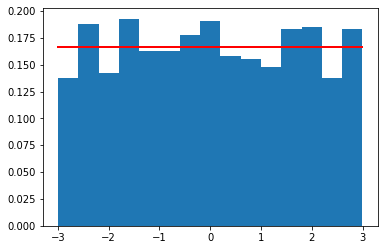

In [14]:
count, bins, ignored = plt.hist(s, 15, density=True)
plt.plot(bins, np.full_like(bins,1/(b-a)), linewidth=2, color='r')
plt.show()

#Gaussian noise

In [15]:
import numpy as np
import os
import cv2
from google.colab.patches import cv2_imshow

In [16]:
def gauss_noise(image, gauss_var=1000):
    mean = 0
    sigma = gauss_var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)

    res = image + gauss
    noisy = np.clip(res, 0, 255).astype(np.uint8)
    return noisy

In [30]:
image = cv2.imread('/content/sunset-1381672.jpg',0)

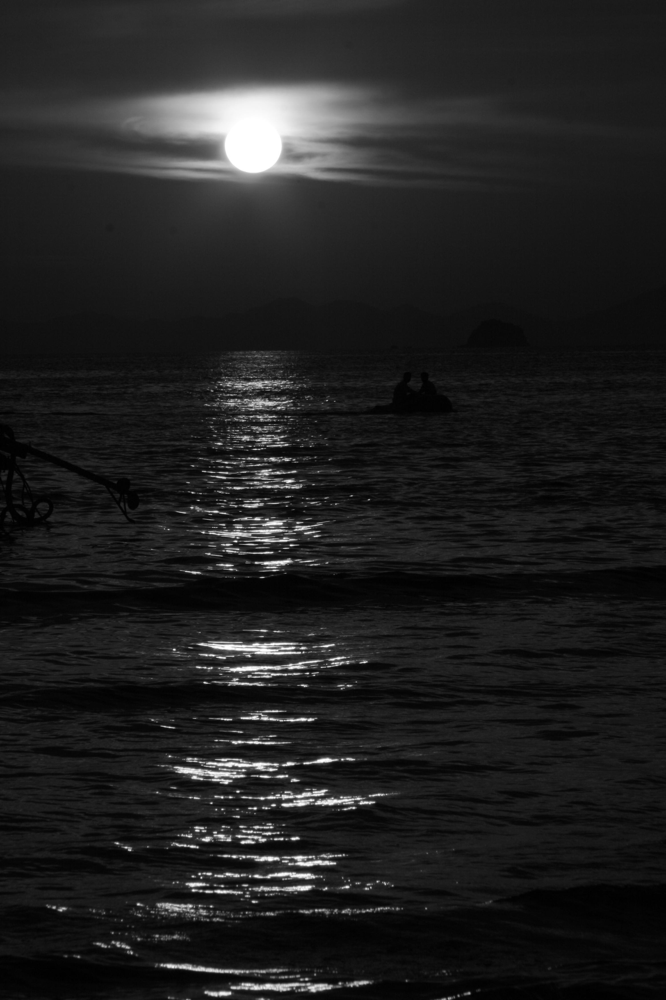

In [31]:
cv2_imshow(image)

In [76]:
image_noise_10000 = gauss_noise(image,10000)

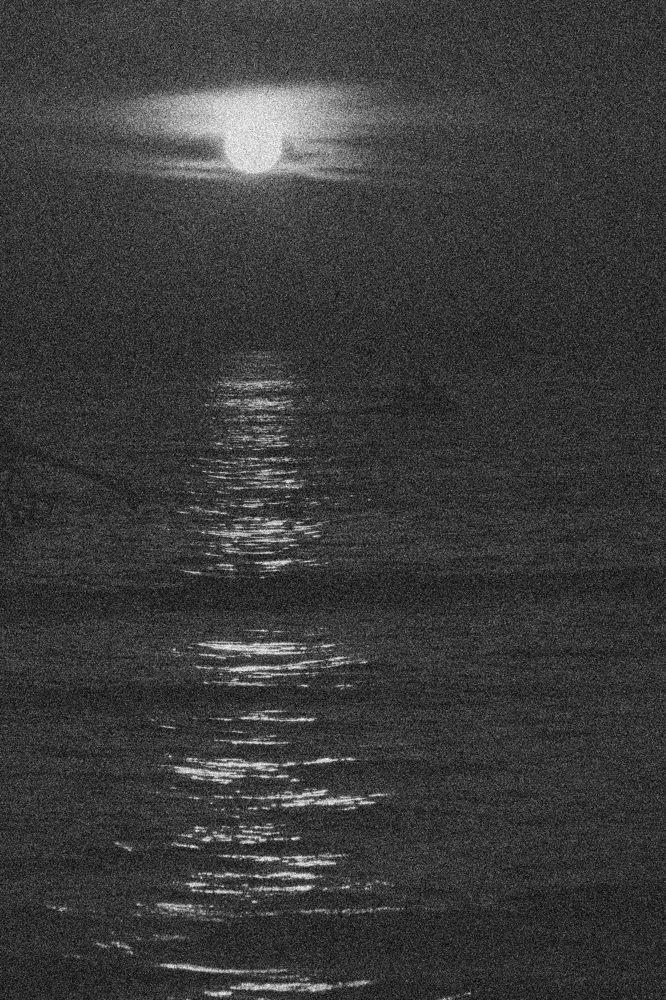

In [77]:
cv2_imshow(image_noise_10000)

In [67]:
image_noise_1000000 = gauss_noise(image,1000000)

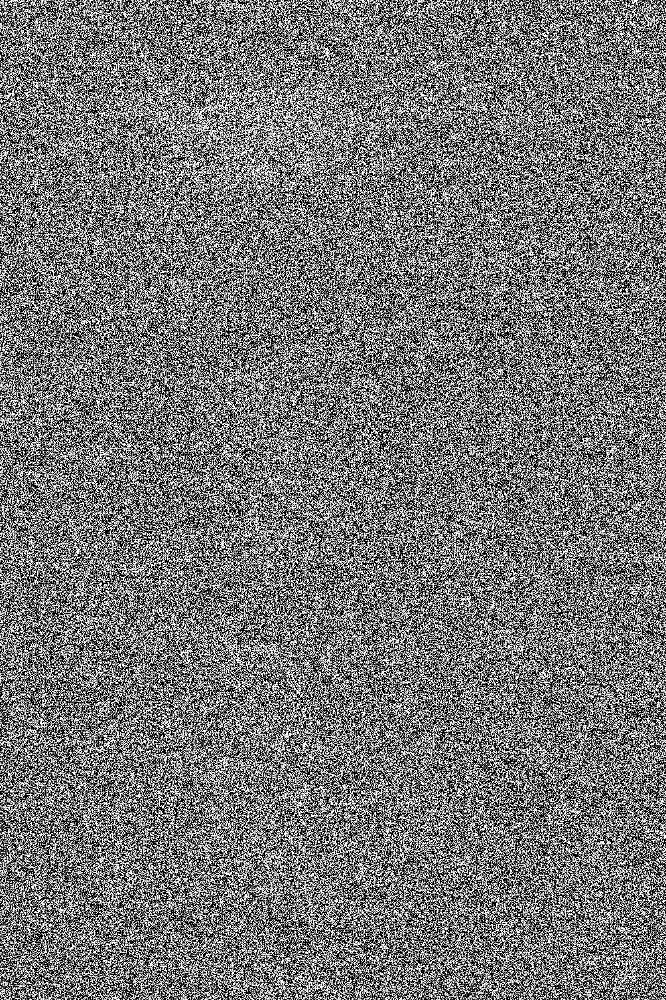

In [68]:
cv2_imshow(image_noise_1000000)

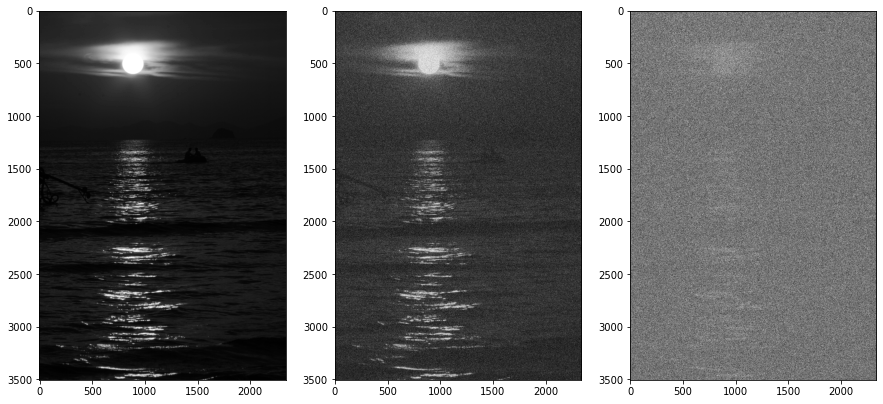

In [78]:
# set up side-by-side image display
fig = plt.figure()
fig.set_figheight(15)
fig.set_figwidth(15)

fig.add_subplot(1,3,1)
plt.imshow(image, cmap='gray')

fig.add_subplot(1,3,2)
plt.imshow(image_noise_10000, cmap='gray')

fig.add_subplot(1,3,3)
plt.imshow(image_noise_1000000, cmap='gray')

plt.show(block=True)